### 图2（a） 巧家地区彩色地形图+台站

C:\Users\DELL\AppData\Local\Temp\ipykernel_27916\4249514298.py:28: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(data_file, delim_whitespace=True, header=None,
C:\Users\DELL\AppData\Local\Temp\ipykernel_27916\4249514298.py:69: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  jiaojihe = pd.read_csv(jiaojihe_file, delim_whitespace=True, header=None,
C:\Users\DELL\AppData\Local\Temp\ipykernel_27916\4249514298.py:75: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  puduhe = pd.read_csv(puduhe_file, delim_whitespace=True, header=None,
C:\Users\DELL\AppData\Local\Temp\ipykernel_27916\4249514298.py:81: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be rem

所有断层图已绘制完成。


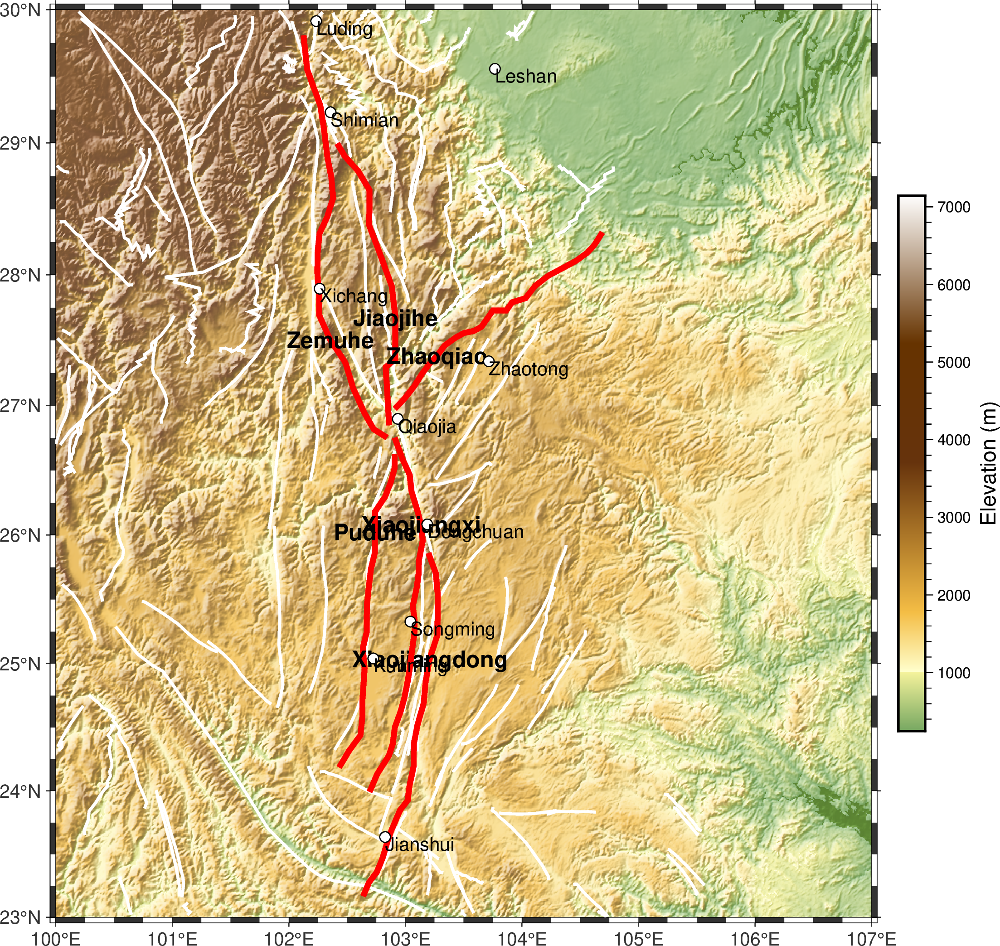

In [13]:
# 看一下BHT里给的断层和鲁人齐的有啥区别
import pygmt
import pandas as pd



# 设置地图区域和投影
region = [100, 107, 23, 30]  # 经度范围: 99 到 106，纬度范围: 22 到 33
grid = pygmt.datasets.load_earth_relief(resolution='30s', region=region)
# 创建一个地图对象
fig = pygmt.Figure()



fig.grdimage(grid=grid, region=region, projection='M6i',cmap='dem1_copy2.cpt',frame=True, shading=True, transparency=20)  
#fig.text(position="MC", text="PyGMT", font="80p,Helvetica-Bold,red@75")
# 添加颜色条（colorbar）
fig.colorbar(
    cmap="dem1_copy2.cpt",     # 使用与图像相同的 CPT 文件
    position="JMR+o0.5c/0c+w10c/0.5c",  # 设置颜色条位置和大小
    frame=["xaf+lElevation (m)"],  # 添加标签，单位为米
)



# 读取转换后的经纬度数据
data_file = "g:/鲁人齐最新全国断层数据/附表1-2与断层数据/processed_fault_data.txt"  # 你的数据文件路径
data = pd.read_csv(data_file, delim_whitespace=True, header=None, 
                   names=[ "FaultName", "Longitude", "Latitude"])
# 确保 X 和 Y 列为 float 类型
# 获取所有唯一的 Faultname
data = data[
    (data["Longitude"] >= region[0]) & (data["Longitude"] <= region[1]) & 
    (data["Latitude"] >= region[2]) & (data["Latitude"] <= region[3])
]
fault_names = data['FaultName'].unique()


# 筛选出在该区域内的断层数据


# 遍历每个 Faultname 分组并绘图
#ipdb.set_trace()
for fault in fault_names:
    # 筛选出当前 Faultname 的数据
    
    fault_data = data[data['FaultName'] == fault]
    # 按照 Y（纬度）列排序，ascending=True 表示从小到大排序
    # fault_data = fault_data.sort_values(by='Latitude').reset_index(drop=True)  
    # print(fault_data)
  
    fig.plot(x=fault_data["Longitude"], y=fault_data["Latitude"], pen="1.5p,white", label="Active fault")
   

    # 添加标题（显示 Faultname）
    # fig.text(
    #     x=midpoint_x,  # 调整位置到图形左上角
    #     y=midpoint_y,
    #     text=f"Fault: {fault}",
    #     font="12p,Helvetica-Bold,black",
    #     offset="0.2c"
    # )



# 添加活断层，假设有一个断层线文件“faults.gmt”
# 读取转换后的经纬度数据
jiaojihe_file = "G:/BHT/交际河断裂坐标.txt"  # 你的数据文件路径
jiaojihe = pd.read_csv(jiaojihe_file, delim_whitespace=True, header=None, 
                   names=["Longitude", "Latitude"])
fig.plot(x=jiaojihe["Longitude"], y=jiaojihe["Latitude"], pen="3p,red", label="Active fault")
fig.text(x=jiaojihe["Longitude"][5], y=jiaojihe["Latitude"][5], text='Jiaojihe', font="12p,Helvetica-Bold,black", justify="CM")

puduhe_file = "G:/BHT/普渡河断裂坐标.txt"  # 你的数据文件路径
puduhe = pd.read_csv(puduhe_file, delim_whitespace=True, header=None, 
                   names=["Longitude", "Latitude"])
fig.plot(x=puduhe["Longitude"], y=puduhe["Latitude"], pen="3p,red", label="Active fault")
fig.text(x=puduhe["Longitude"][5], y=puduhe["Latitude"][5], text='Puduhe', font="12p,Helvetica-Bold,black", justify="CM")

xiaojiangdong_file = "G:/BHT/小江断裂东支坐标.txt"  # 你的数据文件路径
xiaojiangdong = pd.read_csv(xiaojiangdong_file, delim_whitespace=True, header=None, 
                   names=["Longitude", "Latitude"])
fig.plot(x=xiaojiangdong["Longitude"], y=xiaojiangdong["Latitude"], pen="3p,red", label="Active fault")
fig.text(x=xiaojiangdong["Longitude"][5], y=xiaojiangdong["Latitude"][5], text='Xiaojiangdong', font="12p,Helvetica-Bold,black", justify="CM")
xiaojiangxi_file = "G:/BHT/小江断裂西支坐标.txt"  # 你的数据文件路径
xiaojiangxi = pd.read_csv(xiaojiangxi_file, delim_whitespace=True, header=None, 
                   names=["Longitude", "Latitude"])
fig.plot(x=xiaojiangxi["Longitude"], y=xiaojiangxi["Latitude"], pen="3p,red", label="Active fault")
fig.text(x=xiaojiangxi["Longitude"][5], y=xiaojiangxi["Latitude"][5], text='Xiaojiangxi', font="12p,Helvetica-Bold,black", justify="CM")

zemuhe_file = "G:/BHT/则木河断裂坐标.txt"  # 你的数据文件路径
zemuhe = pd.read_csv(zemuhe_file, delim_whitespace=True, header=None, 
                   names=["Longitude", "Latitude"])
fig.plot(x=zemuhe["Longitude"], y=zemuhe["Latitude"], pen="3p,red", label="Active fault")
fig.text(x=zemuhe["Longitude"][5], y=zemuhe["Latitude"][5], text='Zemuhe', font="12p,Helvetica-Bold,black", justify="CM")

zhaoqiao_file = "G:/BHT/昭巧断裂坐标.txt"  # 你的数据文件路径
zhaoqiao = pd.read_csv(zhaoqiao_file, delim_whitespace=True, header=None, 
                   names=["Longitude", "Latitude"])
fig.plot(x=zhaoqiao["Longitude"], y=zhaoqiao["Latitude"], pen="3p,red", label="Active fault")
fig.text(x=zhaoqiao["Longitude"][5], y=zhaoqiao["Latitude"][5], text='Zhaoqiao', font="12p,Helvetica-Bold,black", justify="CM")
print("所有断层图已绘制完成。")
# 读取城市坐标（绘制白色填充黑色边框的圆点）
cities = pd.read_csv("G:/BHT/keycities.txt", sep=" ", header=None, names=["city","longitude", "latitude"], 
                    usecols=[0,1, 2], dtype={"longitude": float, "latitude": float})


# 5. 绘制城市坐标点
fig.plot(x=cities["longitude"], y=cities["latitude"], style="c0.2c", fill="white", pen="0.5p,black")  # 红色小圆点表示城市位置


# 6. 添加城市标签
for i, row in cities.iterrows():
    fig.text(x=row["longitude"], y=row["latitude"], text=row["city"], font="10p,black", justify="LT")


# 添加同心圆
# center_lon, center_lat = 102.5, 29.5  # 中心位置
# for radius in [100, 150, 200]:  # 半径为100 km、150 km、200 km的圆
#    fig.plot(x=center_lon, y=center_lat, style=f"n{radius}k", pen="1p,black,dashed")

# 添加图例
#fig.legend(position="jTR+o0.2c/0.2c", box="+gwhite+p1p",transparency=0)

# 显示图形
fig.show()


### 图2（b） 更小位置的放大板地形+台站位置

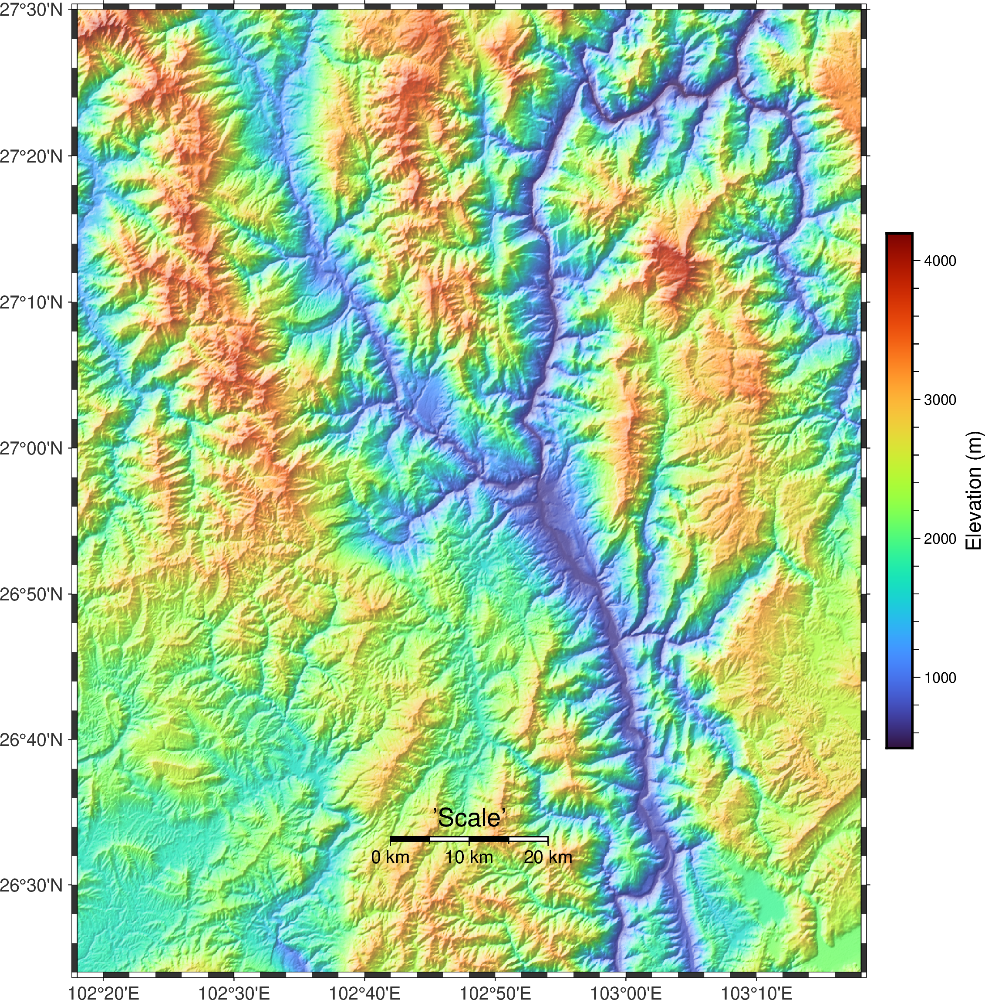

In [3]:
# 看一下BHT里给的断层和鲁人齐的有啥区别
import pygmt
import pandas as pd

# 设置地图区域和投影
region = [102.30, 103.3, 26.4, 27.5]  # 经度范围: 99 到 106，纬度范围: 22 到 33
grid = pygmt.datasets.load_earth_relief(resolution='03s', region=region)
# 创建一个地图对象
fig = pygmt.Figure()

fig.grdimage(grid=grid, region=region, projection='M6i',frame=True, shading=True, transparency=20)  
#fig.text(position="MC", text="PyGMT", font="80p,Helvetica-Bold,red@75")
fig.colorbar(
        # 使用与图像相同的 CPT 文件
    position="JMR+o0.5c/0c+w10c/0.5c",  # 设置颜色条位置和大小
    frame=["xaf+lElevation (m)"],  # 添加标签，单位为米
)
# 新增比例尺
fig.basemap(map_scale="g102.8/26.55+c26.9+w20k+f+u+l'Scale'")
# # 读取转换后的经纬度数据
# data_file = "g:/鲁人齐最新全国断层数据/附表1-2与断层数据/processed_fault_data.txt"  # 你的数据文件路径
# data = pd.read_csv(data_file, delim_whitespace=True, header=None, 
#                    names=[ "FaultName", "Longitude", "Latitude"])
# # 确保 X 和 Y 列为 float 类型
# # 获取所有唯一的 Faultname
# # data = data[
# #     (data["Longitude"] >= region[0]) & (data["Longitude"] <= region[1]) & 
# #     (data["Latitude"] >= region[2]) & (data["Latitude"] <= region[3])
# # ]
# fault_names = data['FaultName'].unique()


# # 筛选出在该区域内的断层数据


# # 遍历每个 Faultname 分组并绘图
# #ipdb.set_trace()
# for fault in fault_names:
#     # 筛选出当前 Faultname 的数据
    
#     fault_data = data[data['FaultName'] == fault]
#     # 按照 Y（纬度）列排序，ascending=True 表示从小到大排序
#     # fault_data = fault_data.sort_values(by='Latitude').reset_index(drop=True)  
#     # print(fault_data)
  
#     fig.plot(x=fault_data["Longitude"], y=fault_data["Latitude"], pen="1.5p,white", label="Active fault")
#     # 计算断层中点的坐标
#     mid_index = len(fault_data) // 2
#     midpoint_x = fault_data.iloc[mid_index]["Longitude"]
#     midpoint_y = fault_data.iloc[mid_index]["Latitude"]
#     # 添加标题（显示 Faultname）
#     # fig.text(
#     #     x=midpoint_x,  # 调整位置到图形左上角
#     #     y=midpoint_y,
#     #     text=f"Fault: {fault}",
#     #     font="12p,Helvetica-Bold,black",
#     #     offset="0.2c"
#     # )



# # 添加活断层，假设有一个断层线文件“faults.gmt”
# # 读取转换后的经纬度数据
# shaoqiao_file = "G:/BHT/交际河断裂坐标.txt"  # 你的数据文件路径
# shaoqiao = pd.read_csv(shaoqiao_file, delim_whitespace=True, header=None, 
#                    names=["Longitude", "Latitude"])
# fig.plot(x=shaoqiao["Longitude"], y=shaoqiao["Latitude"], pen="3p,black", label="Active fault")

# puduhe_file = "G:/BHT/普渡河断裂坐标.txt"  # 你的数据文件路径
# puduhe = pd.read_csv(puduhe_file, delim_whitespace=True, header=None, 
#                    names=["Longitude", "Latitude"])
# fig.plot(x=puduhe["Longitude"], y=puduhe["Latitude"], pen="3p,black", label="Active fault")

# xiaojiangdong_file = "G:/BHT/小江断裂东支坐标.txt"  # 你的数据文件路径
# xiaojiangdong = pd.read_csv(xiaojiangdong_file, delim_whitespace=True, header=None, 
#                    names=["Longitude", "Latitude"])
# fig.plot(x=xiaojiangdong["Longitude"], y=xiaojiangdong["Latitude"], pen="3p,black", label="Active fault")

# xiaojiangxi_file = "G:/BHT/小江断裂西支坐标.txt"  # 你的数据文件路径
# xiaojiangxi = pd.read_csv(xiaojiangxi_file, delim_whitespace=True, header=None, 
#                    names=["Longitude", "Latitude"])
# fig.plot(x=xiaojiangxi["Longitude"], y=xiaojiangxi["Latitude"], pen="3p,blue", label="Active fault")

# zemuhe_file = "G:/BHT/则木河断裂坐标.txt"  # 你的数据文件路径
# zemuhe = pd.read_csv(zemuhe_file, delim_whitespace=True, header=None, 
#                    names=["Longitude", "Latitude"])
# fig.plot(x=zemuhe["Longitude"], y=zemuhe["Latitude"], pen="3p,black", label="Active fault")

# zhaoqiao_file = "G:/BHT/昭巧断裂坐标.txt"  # 你的数据文件路径
# zhaoqiao = pd.read_csv(zhaoqiao_file, delim_whitespace=True, header=None, 
#                    names=["Longitude", "Latitude"])
# fig.plot(x=zhaoqiao["Longitude"], y=zhaoqiao["Latitude"], pen="3p,red", label="Active fault")
# print("所有断层图已绘制完成。")


# 画台站位置
# 在地形图上叠加白色三角形标记的经纬度点
# 读取坐标文件
# stations = pd.read_csv("G:/BHT/station_zt.txt", sep=" ", header=None, usecols=[0, 1],names=["longitude", "latitude"],dtype={"longitude": float, "latitude": float})

# fig.plot(x=stations["longitude"], y=stations["latitude"], style="t0.5c", fill="white", pen="white")

# 宽频带台站
# stations2 = pd.read_csv("G:/BHT/宽频带布点.txt", sep=" ", header=None, usecols=[1, 2],names=[ "latitude","longitude"],dtype={"longitude": float, "latitude": float})

# fig.plot(x=stations2["longitude"], y=stations2["latitude"], style="t0.5c", fill="blue", pen="white")


# 显示图形
fig.show()


### 图2（c）显示地震空区的地震目录深度-距离图

/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_61307/1155145672.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['depth_jitter'] = filtered_df['depth'] + np.random.uniform(-0.5, 0.5, size=len(filtered_df))


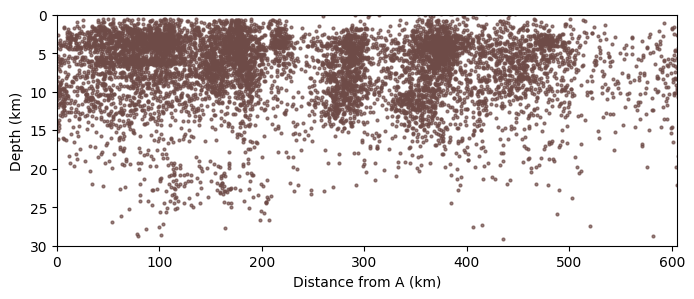

In [1]:
## A-B 巧家-建水 的depth-dis图
import pandas as pd
import numpy as np
from geopy.distance import geodesic

# 读取地震目录数据
# data = 'G:/BHT/alltime_30_23weidu_catalog.txt'

# 将数据转换为DataFrame
column_names = ['year', 'month', 'day', 'hour', 'minute', 'second', 'latitude', 'longitude', 'depth', 'mag_type', 'magnitude','time']
df = pd.read_csv('/Users/chouyuhin/_Workhome/Proj_Seismicgap/Qiaojia/plotting/chuandian_catalog.txt', sep=',', header=0 ,names=column_names)
#df['time'] = pd.to_datetime(df['time'])

# 定义A点和B点的坐标
A_lat, A_lon = 29.23096300, 102.35836400   #shimian
B_lat, B_lon = 23.63582400, 103.52617800   # 建水右边一点

# 计算A-B方向的单位向量（经纬度坐标）
AB_vector = np.array([B_lat - A_lat, B_lon - A_lon])
AB_unit_vector = AB_vector / np.linalg.norm(AB_vector)  # 归一化

# 计算地震点到A点的向量
def compute_parallel_distance(row):
    event_vector = np.array([row['latitude'] - A_lat, row['longitude'] - A_lon])
    return np.dot(event_vector, AB_unit_vector) * geodesic((A_lat, A_lon), (B_lat, B_lon)).kilometers  # 投影到 A-B 方向上

df['parallel_distance'] = df.apply(compute_parallel_distance, axis=1)  # 计算平行距离


# 筛选位于A-B之间的地震点
# 过滤在 A-B 线段范围内的地震
filtered_df = df[(df['parallel_distance'] >= 0) & (df['parallel_distance'] <= geodesic((A_lat, A_lon), (B_lat, B_lon)).kilometers)]


# 输出筛选后的地震点
#print("筛选后的地震点：")
#print(filtered_df)

# 让 depth 增加随机扰动，防止数据点重合
filtered_df['depth_jitter'] = filtered_df['depth'] + np.random.uniform(-0.5, 0.5, size=len(filtered_df))

# 绘制深度-距离图
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 3), dpi=100)
plt.scatter(filtered_df['parallel_distance'], filtered_df['depth_jitter'], s=4,alpha=0.7, color='#6E4B47')
plt.xlabel('Distance from A (km)')
plt.ylabel('Depth (km)')
plt.ylim(0,30)
plt.xlim(0,605)
#plt.title('Depth-Distance Profile (A-B)')
plt.grid(False)
plt.gca().invert_yaxis()  # 反转Y轴，使深度向下增加
#plt.legend()
# 保存为矢量图（选择一种格式）
# plt.savefig("Fig2c_depth_distance.eps", format='eps', dpi=650)
plt.show()

## 画我扫描出来的巧家-建水目录 的depth-dis图

d:\Anaconda\envs\eqtransformer\lib\site-packages\ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


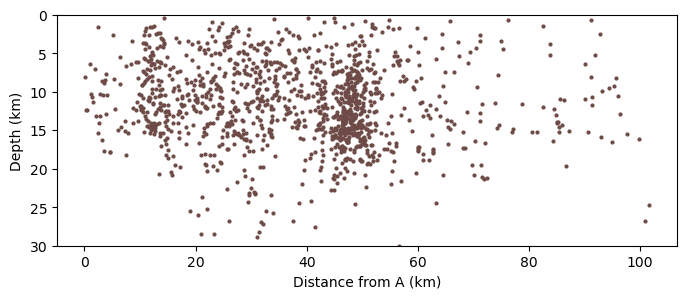

In [119]:
## A-B 沿着白鹤滩水库 的depth-dis图
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from geopy.distance import geodesic

# 读取hypoDD_v2_2208.loc文件（假设是空格分隔的固定宽度格式）
column_names = ['id', 'lat', 'lon', 'depth', 'dx', 'dy', 'dz', 'EX', 'EY', 'EZ', 'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude','NCCP','NCCS','NCTP','NCTS','RCC','RCT','CID']
my_catalog = pd.read_csv('D:\MyRepository\Qiaojia\gamma2Hypoinverse\hypoDD_v2_1307_withmag.reloc', delim_whitespace=True, header=0, names=column_names)

my_catalog.dropna(subset=['lon', 'lat', 'depth', 'magnitude'], inplace=True)
# 合并日期和时间列，创建一个新的 'datetime' 列
my_catalog['time'] = pd.to_datetime(my_catalog[['year', 'month', 'day', 'hour', 'minute', 'second']])
#df['time'] = pd.to_datetime(df['time'])

# 定义A点和B点的坐标
A_lat, A_lon = 27.23096300, 102.8   #shimian
B_lat, B_lon = 26.2, 103.0   # 建水右边一点

# 计算A-B方向的单位向量（经纬度坐标）
AB_vector = np.array([B_lat - A_lat, B_lon - A_lon])
AB_unit_vector = AB_vector / np.linalg.norm(AB_vector)  # 归一化

# 计算地震点到A点的向量
def compute_parallel_distance(row):
    event_vector = np.array([row['lat'] - A_lat, row['lon'] - A_lon])
    return np.dot(event_vector, AB_unit_vector) * geodesic((A_lat, A_lon), (B_lat, B_lon)).kilometers  # 投影到 A-B 方向上

my_catalog['parallel_distance'] = my_catalog.apply(compute_parallel_distance, axis=1)  # 计算平行距离


# 筛选位于A-B之间的地震点
# 过滤在 A-B 线段范围内的地震
filtered_df = my_catalog[(my_catalog['parallel_distance'] >= 0) & (my_catalog['parallel_distance'] <= geodesic((A_lat, A_lon), (B_lat, B_lon)).kilometers)]


# 输出筛选后的地震点
#print("筛选后的地震点：")
#print(filtered_df)

# 让 depth 增加随机扰动，防止数据点重合
filtered_df['depth_jitter'] = filtered_df['depth'] + np.random.uniform(-0.5, 0.5, size=len(filtered_df))

# 绘制深度-距离图

plt.figure(figsize=(8, 3), dpi=100)
plt.scatter(filtered_df['parallel_distance'], filtered_df['depth_jitter'], s=4,alpha=1, color='#6E4B47')
plt.xlabel('Distance from A (km)')
plt.ylabel('Depth (km)')
plt.ylim(0,30)
# plt.xlim(0,605)
#plt.title('Depth-Distance Profile (A-B)')
plt.grid(False)
plt.gca().invert_yaxis()  # 反转Y轴，使深度向下增加
#plt.legend()
# 保存为矢量图（选择一种格式）
# plt.savefig("Fig2c_depth_distance.eps", format='eps', dpi=650)
plt.show()

/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_91065/1300845920.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_ai = cm.get_cmap('viridis')
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_91065/1300845920.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_std = cm.get_cmap('gray_r')
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_91065/1300845920.py:55: UserWarning: No data for colormapping provided via 'c'. Parameters 'norm' will be ignored
  ax1.scatter(df['time'], df['magnitude'],c='gray', norm=norm,edgecolor='k', linewidth=0.5,
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipyker

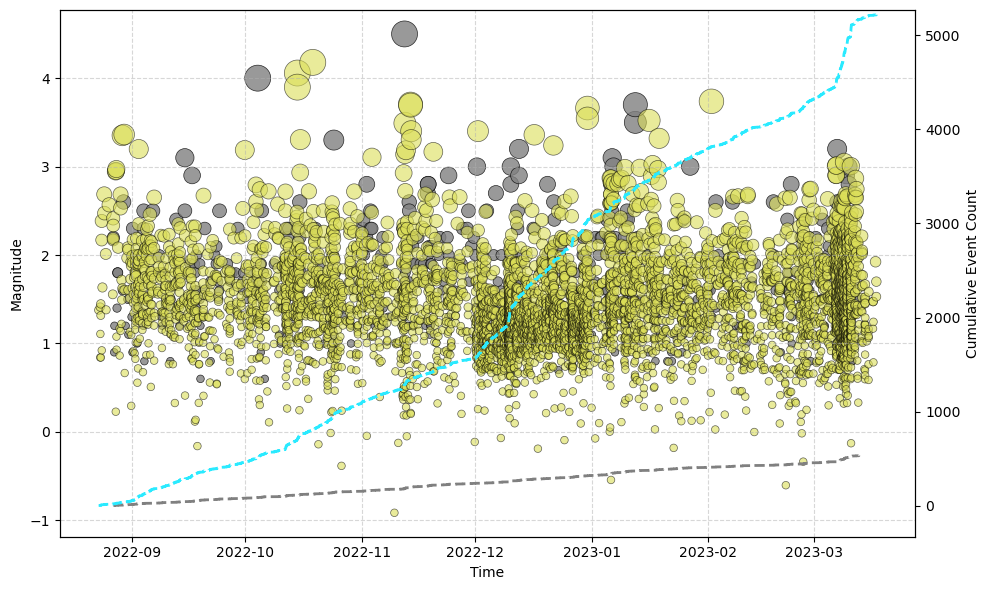

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.cm as cm
from matplotlib.colors import Normalize
import matplotlib.dates as mdates

# ===============================
# 读取标准目录
# ===============================
column_names = ['year', 'month', 'day', 'hour', 'minute', 'second', 
                'latitude', 'longitude', 'depth', 'mag_type', 'magnitude','time']
df = pd.read_csv('/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/standard_catalog_QJ_220825_230313.csv', header=0, names=column_names, sep=',')
df['time'] = pd.to_datetime(df['time'])

# ===============================
# 读取 hypoDD_v2 目录
# ===============================
column_names_hypo = ['lat', 'lon', 'depth', 'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude','time']

my_catalog = pd.read_csv(
    '/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/hypoDD_final_allevents.reloc', 
 sep='\t', names=column_names_hypo,header=0
)
# my_catalog.dropna(subset=['lon', 'lat', 'depth', 'magnitude'], inplace=True)
# my_catalog['time'] = pd.to_datetime(my_catalog[['year', 'month', 'day', 'hour', 'minute', 'second']])
my_catalog['time'] = pd.to_datetime(my_catalog['time'])
# ===============================
# 定义 marker size 缩放函数
# ===============================
def scale_marker_size(mag_series, scale_factor=10, min_size=30, max_size=350):
    """
    按震级缩放 marker 大小。
    scale_factor 控制总体放大倍率，
    min_size / max_size 限制范围，避免过小或过大。
    """
    sizes = (10 ** (0.4 * mag_series)) * scale_factor
    return np.clip(sizes, min_size, max_size)

df['size'] = scale_marker_size(df['magnitude'], scale_factor=10)
my_catalog['size'] = scale_marker_size(my_catalog['magnitude'], scale_factor=10)

# ===============================
# 绘图
# ===============================
fig, ax1 = plt.subplots(figsize=(10, 6))
# 统一时间范围
vmin = min(my_catalog['time'].min(), df['time'].min())
vmax = max(my_catalog['time'].max(), df['time'].max())

norm = Normalize(vmin=mdates.date2num(vmin), vmax=mdates.date2num(vmax))
cmap_ai = cm.get_cmap('viridis')
cmap_std = cm.get_cmap('gray_r')
# --- M–T 散点图 ---
ax1.scatter(df['time'], df['magnitude'],c='gray', norm=norm,edgecolor='k', linewidth=0.5,
            s=df['size'], alpha=0.8, label='Standard')

ax1.scatter(my_catalog['time'], my_catalog['magnitude'],c='#dbde57', norm=norm, edgecolor='k', linewidth=0.5,
            s=my_catalog['size'],  alpha=0.6, label='AI-powered')

ax1.set_xlabel('Time')
ax1.set_ylabel('Magnitude')
ax1.grid(True, linestyle='--', alpha=0.5)

# --- 累积曲线 (右轴) ---
ax2 = ax1.twinx()  # 创建共享 x 轴的右侧 y 轴
# 累积事件数
df_sorted = df.sort_values(by='time')
cum_std = np.arange(1, len(df_sorted)+1)

my_sorted = my_catalog.sort_values(by='time')
cum_hypo = np.arange(1, len(my_sorted)+1)

# --- 计算缩放比例，使左轴 0 对齐右轴 0 ---
mag_min, mag_max = ax1.get_ylim()   # 左轴范围
mag_zero = 0                        # 左轴0的位置
cum_max = max(cum_std[-1], cum_hypo[-1])

# 缩放比例 = 左轴上方空间 / 右轴最大累计数
scale = (mag_max - mag_zero) / cum_max

# 缩放累计数
cum_std_scaled = cum_std * scale + mag_zero
cum_hypo_scaled = cum_hypo * scale + mag_zero
# 标准目录 cumulative
df_sorted = df.sort_values(by='time')
cumulative_std = range(1, len(df_sorted)+1)
ax2.step(df_sorted['time'], cumulative_std, where='post', color='gray', linestyle='--', linewidth=2, label='Standard: Cumulative')

# HypoDD cumulative
my_sorted = my_catalog.sort_values(by='time')
cumulative_hypo = range(1, len(my_sorted)+1)
ax2.step(my_sorted['time'], cumulative_hypo, where='post', color="#2aeaff", linestyle='--', linewidth=2, label='AI-powered: Cumulative')

ax2.set_ylabel('Cumulative Event Count')
ax2.set_ylim(-330, max(len(df), len(my_catalog)+50))

# --- 合并图例 ---
lines_labels = [ax.get_legend_handles_labels() for ax in [ax1, ax2]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
# ax1.legend(lines, labels, loc='upper left')

plt.savefig("Fig3b_MT_with_cumulative.svg", format='svg', dpi=650)
plt.tight_layout()
plt.show()


/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_8265/1621680208.py:56: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(0,10**4)


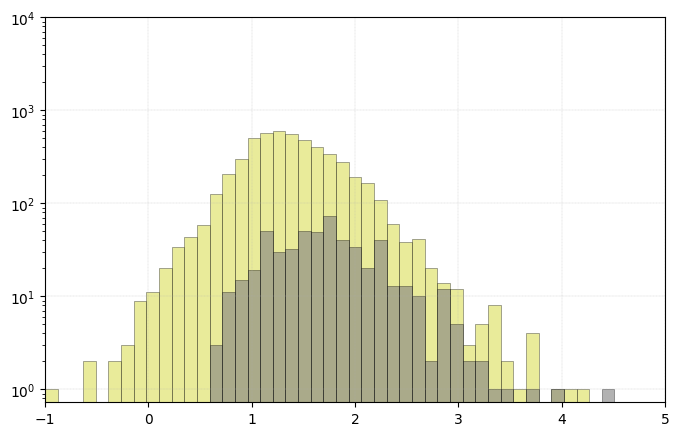

In [99]:
import numpy as np

import matplotlib.pyplot as plt

import pandas as pd



column_names = ['year', 'month', 'day', 'hour', 'minute', 'second',

'latitude', 'longitude', 'depth', 'mag_type', 'magnitude','time']

df = pd.read_csv('/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/standard_catalog_QJ_220825_230313.csv', header=0, names=column_names, sep=',')

df['time'] = pd.to_datetime(df['time'])



# ===============================

# 读取 hypoDD_v2 目录

# ===============================

column_names_hypo = ['lat', 'lon', 'depth', 'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude','time']



my_catalog = pd.read_csv(

'/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/hypoDD_final_allevents.reloc',

sep='\t', names=column_names_hypo,header=0

)



# 设置直方图的参数

bins = np.linspace(-1, 5, 50)



# 绘制直方图

ax = plt.figure(figsize=(8,5))

plt.hist(my_catalog['magnitude'], bins=bins, color='#dbde57', alpha=0.6, label='AI-powered', log=True,edgecolor='black', linewidth=0.4)



plt.hist(df['magnitude'], bins=bins, color="gray", alpha=0.6, label='Standard', log=True,edgecolor='black', linewidth=0.4)

plt.xlim(-1, 5)
plt.ylim(0,10**4)

# 添加标签和标题

# plt.xlabel("Magnitude")

# plt.ylabel("Frequency")

# plt.legend()

plt.grid(True, which='major', linestyle='--', linewidth=0.2)

plt.savefig("Fig3c_frequenc_updatedy.svg", format='svg', dpi=650)

# 显示图像

plt.show()

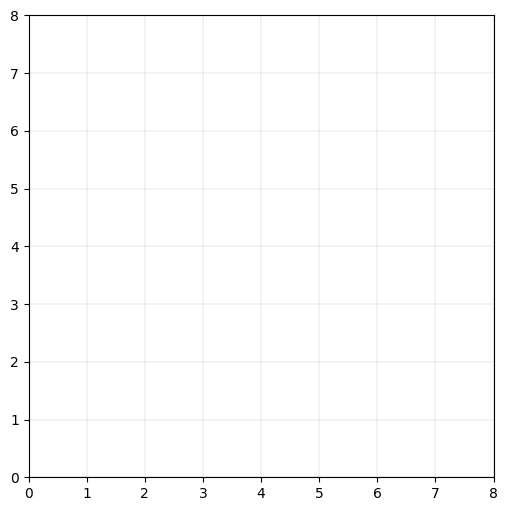

In [104]:
ax = plt.figure(figsize=(6,6))
plt.grid(True, which='major', linestyle='-', linewidth=0.2)
plt.xlim(0,8)

plt.ylim(0,8)
plt.savefig("grid.svg", format='svg', dpi=650)


## 画随时间的频率直方图和累计曲线图

/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_91065/1883200503.py:39: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, delim_whitespace=True, header=None,
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_91065/1883200503.py:39: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(file_path, delim_whitespace=True, header=None,


✅ 已保存平滑结果到: /Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/蒙姑水位_Menggu Station_smooth_Menggu Station_smooth.txt
✅ 已保存平滑结果到: /Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/waterlev/巧家老店水位_Qiaojia Laodian Station_smooth.txt
🔹 Menggu Station correlation: r = -0.098, p = 1.597e-01
🔹 Waterlev Station correlation: r = -0.200, p = 3.976e-01


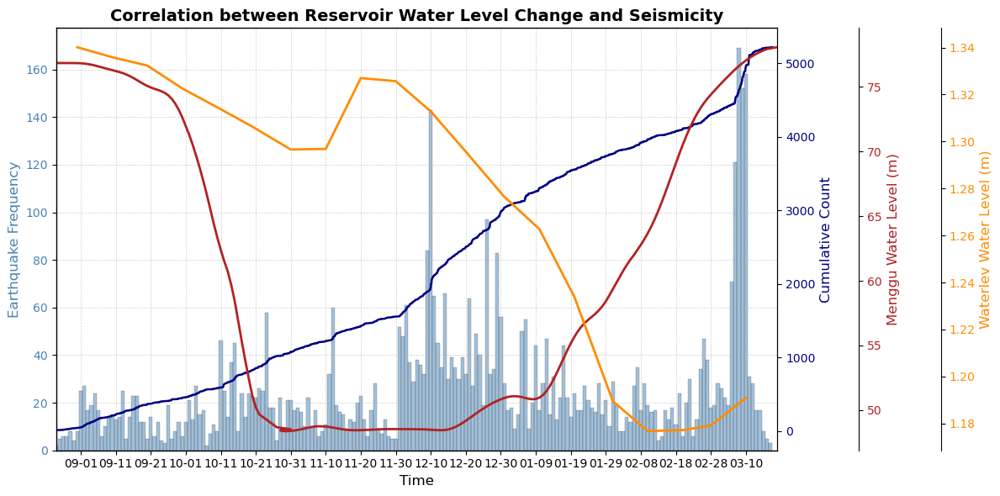

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates
from scipy.stats import pearsonr

# ===============================
# 读取 hypoDD_v2 目录
# ===============================
column_names_hypo = ['lat', 'lon', 'depth', 'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude','time']

my_catalog = pd.read_csv(
    '/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/hypoDD_final_allevents.reloc', 
    sep='\t', names=column_names_hypo, header=0
)
my_catalog['time'] = pd.to_datetime(my_catalog['time'])
my_catalog.sort_values(by='time', inplace=True)
my_catalog['cumulative'] = np.arange(1, len(my_catalog) + 1)

# === 时间范围 ===
start_date = pd.to_datetime("2022-08-25")
end_date = pd.to_datetime("2023-03-19")
bins = pd.date_range(start=start_date, end=end_date, freq='D')

# === 每日地震频次 ===
hist, _ = np.histogram(my_catalog['time'], bins=bins)
cumulative_counts = np.cumsum(hist)
dates = bins[:-1]

# === 保存每日地震频次到 txt 文件 ===
df_daily = pd.DataFrame({'date': dates, 'count': hist})
df_daily.to_csv(
    '/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/daily_earthquake_frequency.txt',
    sep='\t', index=False, header=False, date_format='%Y-%m-%d'
)

# === 读取水位数据函数 ===
def read_water_level(file_path, name, window=7, date_format='%Y-%m-%d'):  # ← 新增参数
    df = pd.read_csv(file_path, delim_whitespace=True, header=None,
                     engine="python", names=['date', 'level'])
    df['date'] = pd.to_datetime(df['date'], format=date_format)           # ← 使用参数
    df = df[(df['date'] >= start_date) & (df['date'] <= end_date)].copy()
    df['smooth'] = df['level'].rolling(window=window, center=True, min_periods=1).mean()
    output_path = file_path.replace('.txt', f'_{name}_smooth.txt')
    df[['date', 'smooth']].to_csv(output_path, sep='\t', index=False, header=True)
    print(f"✅ 已保存平滑结果到: {output_path}")
    df['cum_change'] = df['smooth'] - df['smooth'].iloc[0]
    df['name'] = name
    return df


# *** 修改1：新增第二个水位文件 ***
water_mg = read_water_level('/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/蒙姑水位_Menggu Station_smooth.txt', 'Menggu Station',date_format='%Y-%m-%d')
water_wl = read_water_level('/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/waterlev/巧家老店水位.txt', 'Qiaojia Laodian Station',date_format='%Y%m%d')

# === 准备每日地震频率 DataFrame ===
daily_eq = pd.DataFrame({'date': bins[:-1], 'eq_freq': hist})

# === 合并数据以便计算相关系数 ===
merged_mg = pd.merge(daily_eq, water_mg[['date', 'cum_change']], on='date', how='inner')
merged_wl = pd.merge(daily_eq, water_wl[['date', 'cum_change']], on='date', how='inner')

# === 计算皮尔森相关系数 ===
corr_mg, pval_mg = pearsonr(merged_mg['eq_freq'], merged_mg['cum_change'])
corr_wl, pval_wl = pearsonr(merged_wl['eq_freq'], merged_wl['cum_change'])

print(f"🔹 Menggu Station correlation: r = {corr_mg:.3f}, p = {pval_mg:.3e}")
print(f"🔹 Waterlev Station correlation: r = {corr_wl:.3f}, p = {pval_wl:.3e}")

# === 绘图 ===
fig, ax1 = plt.subplots(figsize=(12, 6))

# --- 地震频次柱状图 ---
ax1.bar(bins[:-1], hist, width=1, color='steelblue', alpha=0.5,
        edgecolor='black', linewidth=0.25, label='Daily Earthquake Count')
ax1.set_ylabel("Earthquake Frequency", fontsize=12, color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')
ax1.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.6)

# --- 累积地震数 ---
ax2 = ax1.twinx()
ax2.plot(my_catalog['time'], my_catalog['cumulative'], color='navy', linewidth=1.8, label='Cumulative Seismicity')
ax2.set_ylabel("Cumulative Count", fontsize=12, color='navy')
ax2.tick_params(axis='y', labelcolor='navy')

def normalize(series):
    return (series - series.min()) / (series.max() - series.min())

# --- Menggu 水位绝对值曲线（第三纵轴）---
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 70))
ax3.plot(water_mg['date'], water_mg['smooth'],
         color='firebrick', linewidth=2, label='Menggu Water Level (m)')
ax3.set_ylabel("Menggu Water Level (m)", fontsize=12, color='firebrick')
ax3.tick_params(axis='y', labelcolor='firebrick')

# --- Waterlev 水位绝对值曲线（第四纵轴）---
ax4 = ax1.twinx()
ax4.spines['right'].set_position(('outward', 140))  # 再向右偏移 70px
ax4.plot(water_wl['date'], water_wl['smooth'],
         color='darkorange', linewidth=2, label='Waterlev Water Level (m)')
ax4.set_ylabel("Waterlev Water Level (m)", fontsize=12, color='darkorange')
ax4.tick_params(axis='y', labelcolor='darkorange')

# --- 坐标轴与标签 ---
ax1.set_xlabel("Time", fontsize=12)
ax1.set_xlim([start_date, end_date])
ax1.xaxis.set_major_locator(mdates.DayLocator(interval=10))
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.xticks(rotation=45, ha='right')

lines, labels = [], []
for ax in [ax1, ax2, ax3, ax4]:
    line, label = ax.get_legend_handles_labels()
    lines += line
    labels += label
# ax1.legend(lines, labels, loc='upper center', fontsize=12)

# --- 优化外观 ---
plt.title("Correlation between Reservoir Water Level Change and Seismicity", fontsize=14, weight='bold')
plt.tight_layout()

plt.savefig("Fig3d_freT.svg", format='svg', dpi=650)
plt.show()

### 沿纬度剖面的深度图

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# 读取hypoDD_v2_2208.loc文件
column_names = ['id', 'lat', 'lon', 'depth', 'dx', 'dy', 'dz', 'EX', 'EY', 'EZ', 'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude','NCCP','NCCS','NCTP','NCTS','RCC','RCT','CID']
my_catalog = pd.read_csv('D:/MyRepository/Qiaojia/gamma2Hypoinverse/hypoDD_v2_2208_withmag.loc', delim_whitespace=True, header=0, names=column_names)
my_catalog['time'] = pd.to_datetime(my_catalog[['year', 'month', 'day', 'hour', 'minute', 'second']])
my_catalog.sort_values(by='time', inplace=True)
my_catalog['cumulative'] = np.arange(1, len(my_catalog) + 1)

gamma_catalog = pd.read_csv("D:\MyRepository\Qiaojia\AssResults_modifydepth\gamma_catalog.csv", skip_blank_lines=True,sep='\t', usecols=["time","magnitude", "longitude", "latitude"])
gamma_catalog['time'] = pd.to_datetime(gamma_catalog['time'])
gamma_catalog['cumulative'] = np.arange(1, len(gamma_catalog) + 1)



# 绘制直方图和累积曲线
fig, ax1 = plt.subplots(figsize=(10, 5))

# 绘制纬度分布柱状图
lat_bins = np.arange(my_catalog['lat'].min()-0.1, my_catalog['lat'].max()+0.1, 0.1)  # 0.1度间隔
hist, edges = np.histogram(my_catalog['lat'], bins=lat_bins)
ax1.bar(edges[:-1], hist, width=0.08, align='edge', color='darkblue', alpha=0.8, label='Events by Latitude')


ax1.set_xlabel("Latitude (degrees)", fontsize=12)
ax1.set_ylabel("Frequency")
ax1.set_xlim(my_catalog['lat'].max()+0.1, my_catalog['lat'].min()-0.1)  # 从高到低显示
ax1.legend()
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
# ax1.xaxis.set_major_locator(mdates.MonthLocator())
# ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
# plt.xticks(rotation=45)

# 添加累积曲线
ax2 = ax1.twinx()
# ax2.plot(my_catalog['lat'], my_catalog['cumulative'], 
#          color='red', linestyle='-', linewidth=1.5, label='Cumulative Count')
ax2.set_ylabel("Cumulative Count", fontsize=12)

# 显示图像
plt.show()

<>:13: SyntaxWarning: invalid escape sequence '\M'
<>:13: SyntaxWarning: invalid escape sequence '\M'
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_8265/3517551537.py:13: SyntaxWarning: invalid escape sequence '\M'
  gamma_catalog = pd.read_csv("D:\MyRepository\Qiaojia\AssResults_modifydepth\gamma_catalog.csv", skip_blank_lines=True,sep='\t', usecols=["time","magnitude", "longitude", "latitude"])
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_8265/3517551537.py:8: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  my_catalog = pd.read_csv('D:/MyRepository/Qiaojia/gamma2Hypoinverse/hypoDD_v2_2208_withmag.loc', delim_whitespace=True, header=0, names=column_names)
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_8265/3517551537.py:13: SyntaxWarning: invalid escape sequence '\M'
  gamma_catalog = pd.read_csv("D:\MyRepository\Qiaojia\AssResults_modifydepth\gamma_ca

FileNotFoundError: [Errno 2] No such file or directory: 'D:/MyRepository/Qiaojia/gamma2Hypoinverse/hypoDD_v2_2208_withmag.loc'

<>:10: SyntaxWarning: invalid escape sequence '\M'
<>:10: SyntaxWarning: invalid escape sequence '\M'
C:\Users\DELL\AppData\Local\Temp\ipykernel_19632\2299907059.py:10: SyntaxWarning: invalid escape sequence '\M'
  my_catalog = pd.read_csv('D:\MyRepository\Qiaojia\gamma2Hypoinverse\hypoDD_v2_1307_withmag_modified.reloc', delim_whitespace=True, header=0, names=column_names)


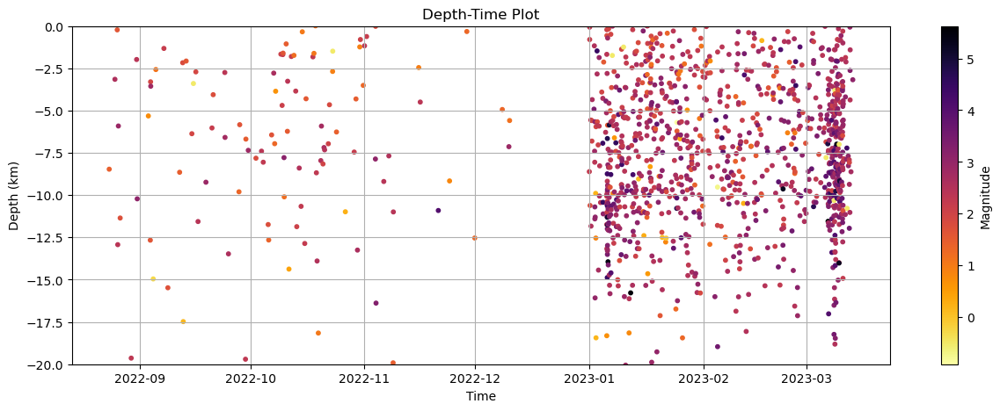

In [67]:
## Depth-Time图

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
# 所有目录
# 注意：文件没有表头，需要手动指定列名
# 读取hypoDD_v2_2208.loc文件（假设是空格分隔的固定宽度格式）
column_names = ['id', 'lat', 'lon', 'depth', 'dx', 'dy', 'dz', 'EX', 'EY', 'EZ', 'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude','NCCP','NCCS','NCTP','NCTS','RCC','RCT','CID']
my_catalog = pd.read_csv('D:\MyRepository\Qiaojia\gamma2Hypoinverse\hypoDD_v2_1307_withmag_modified.reloc', delim_whitespace=True, header=0, names=column_names)

# 合并日期和时间列，创建一个新的 'datetime' 列
my_catalog['time'] = pd.to_datetime(my_catalog[['year', 'month', 'day', 'hour', 'minute', 'second']])
# 绘制Depth-Time图
plt.figure(figsize=(15, 5))
plt.scatter(my_catalog['time'], -my_catalog['depth'], c=my_catalog['magnitude'], cmap='inferno_r', s=10)
plt.colorbar(label='Magnitude')
# plt.ylim(0, 30)
plt.xlabel('Time')
plt.ylabel('Depth (km)')
plt.ylim(-20, 0)
plt.title('Depth-Time Plot')
plt.grid(True)
plt.savefig("Fig3e_DT.eps", format='eps', dpi=650)
plt.show()

### 放在地形图下面的深度-纬度剖面

/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_91065/3331211935.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_ai = cm.get_cmap('viridis')
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_91065/3331211935.py:69: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_std = cm.get_cmap('gray_r')
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_91065/3331211935.py:133: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_histx.legend(fontsize=8)
/var/folders/y4/__h0s0zj0qb4gjkjzynn

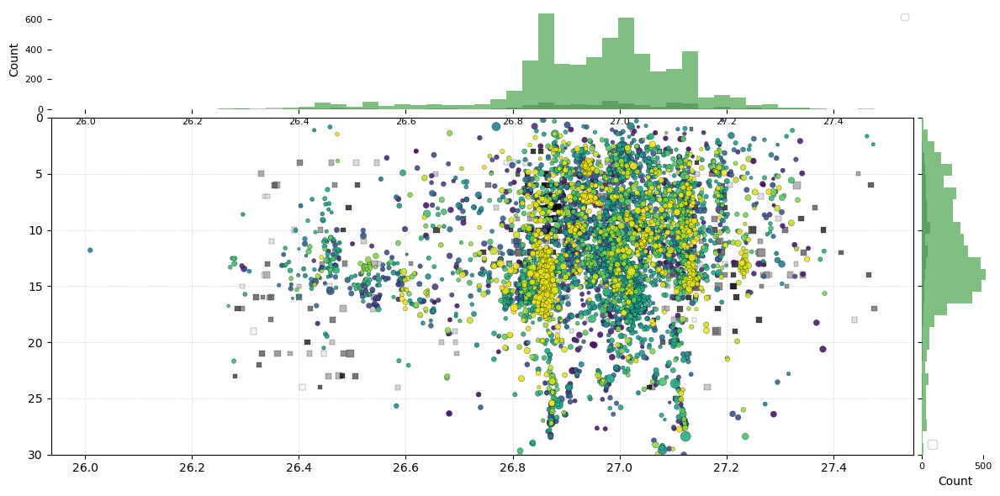

In [29]:
## Depth-Time图
## Depth-Time图（改进版）
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.dates as mdates
from matplotlib import cm
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
import os

# === 文件路径（按需修改） ===
ai_path = r'/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/hypoDD_final_allevents.reloc'
standard_path = r'/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/standard_catalog_QJ_220825_230313.csv'

# === 读取 AI 目录 ===
column_names = ['id', 'lat', 'lon', 'depth', 'dx', 'dy', 'dz',
                'EX', 'EY', 'EZ', 'year', 'month', 'day', 'hour',
                'minute', 'second', 'magnitude', 'NCCP', 'NCCS',
                'NCTP', 'NCTS', 'RCC', 'RCT', 'CID']

column_names_hypo = ['lat', 'lon', 'depth', 'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude','time']
my_catalog = pd.read_csv(ai_path,  sep='\t', names=column_names_hypo,header=0)

my_catalog['time'] = pd.to_datetime(my_catalog[['year', 'month', 'day', 'hour', 'minute', 'second']])
my_catalog = my_catalog[my_catalog['depth'] >= 0].copy()

# === 读取标准目录 ===
standard_catalog = pd.read_csv(standard_path)

# 确保 time 是 datetime
if not np.issubdtype(standard_catalog['time'].dtype, np.datetime64):
    standard_catalog['time'] = pd.to_datetime(standard_catalog['time'])

standard_catalog = standard_catalog[standard_catalog['depth'] >= 0].copy()

# === 点大小缩放函数 ===
def scale_marker_size(mag_series, scale_factor=6, min_size=6, max_size=300):
    sizes = (10 ** (0.3 * mag_series)) * scale_factor
    return np.clip(sizes, min_size, max_size)

my_catalog['size'] = scale_marker_size(my_catalog['magnitude'], scale_factor=6)

if 'magnitude' in standard_catalog.columns:
    standard_catalog['size'] = scale_marker_size(standard_catalog['magnitude'], scale_factor=6)
else:
    mag_col = None
    for cand in ['mag', 'Mag', 'M', 'Mw']:
        if cand in standard_catalog.columns:
            mag_col = cand
            break
    if mag_col:
        standard_catalog['size'] = scale_marker_size(standard_catalog[mag_col], scale_factor=6)
    else:
        standard_catalog['size'] = np.full(len(standard_catalog), 20.0)

# === 时间归一化/映射准备（统一时间区间） ===
my_catalog['time_num'] = mdates.date2num(my_catalog['time'])
standard_catalog['time_num'] = mdates.date2num(standard_catalog['time'])

# 统一色标区间
vmin_time = min(my_catalog['time_num'].min(), standard_catalog['time_num'].min())
vmax_time = max(my_catalog['time_num'].max(), standard_catalog['time_num'].max())

norm = Normalize(vmin=vmin_time, vmax=vmax_time)

# 更易区分的 colormap
cmap_ai = cm.get_cmap('viridis')
cmap_std = cm.get_cmap('gray_r')

sm_ai = cm.ScalarMappable(norm=norm, cmap=cmap_ai)
sm_ai.set_array([])
sm_std = cm.ScalarMappable(norm=norm, cmap=cmap_std)
sm_std.set_array([])

# === 绘图 ===
fig, ax = plt.subplots(figsize=(12, 6))

sc_std = plt.scatter(
    standard_catalog['latitude'],
    standard_catalog['depth'],
    c=standard_catalog['time_num'],
    cmap=cmap_std,
    norm=norm,
    s=standard_catalog['size'],
    alpha=0.8,
    edgecolors='k',
    linewidths=0.2,
    marker='s',
    label='Standard Catalog'
)

sc_ai = plt.scatter(
    my_catalog['lat'],
    my_catalog['depth'],
    c=my_catalog['time_num'],
    cmap=cmap_ai,
    norm=norm,
    s=my_catalog['size'],
    alpha=0.9,
    edgecolors='k',
    linewidths=0.2,
    label='AI Catalog'
)
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.3)
# 指定 colorbar 属于 fig，并明确 ax
# cbar_ai = fig.colorbar(sm_ai, ax=ax, pad=0.01, aspect=30)
# cbar_std = fig.colorbar(sm_std, ax=ax, pad=0.12, aspect=30)

# 设置可读日期格式
date_ticks = np.linspace(vmin_time, vmax_time, 5)
date_labels = [mdates.num2date(t).strftime('%Y-%m-%d') for t in date_ticks]

# cbar_ai.set_ticks(date_ticks)
# cbar_ai.set_ticklabels(date_labels)
# cbar_ai.set_label('AI origin time', fontsize=10)

# cbar_std.set_ticks(date_ticks)
# cbar_std.set_ticklabels(date_labels)
# cbar_std.set_label('Standard origin time', fontsize=10)
# === 添加上方和右侧直方图 ===
divider = make_axes_locatable(ax)
ax_histx = divider.append_axes("top", 1.2, pad=0.1, sharex=ax)
ax_histy = divider.append_axes("right", 0.8, pad=0.1, sharey=ax)

# 上方直方图（Lat分布）
bins_lat = np.linspace(
    min(my_catalog['lat'].min(), standard_catalog['latitude'].min()),
    max(my_catalog['lat'].max(), standard_catalog['latitude'].max()), 50
)
ax_histx.hist(standard_catalog['latitude'], bins=bins_lat, alpha=0.5, color='gray', )
ax_histx.hist(my_catalog['lat'], bins=bins_lat, alpha=0.5, color='green')
ax_histx.legend(fontsize=8)
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histx.set_ylabel("Count")
ax_histx.spines['top'].set_visible(False)
ax_histx.spines['right'].set_visible(False)
ax_histx.spines['left'].set_visible(False)
ax_histx.spines['bottom'].set_visible(False)

# 右侧直方图（Depth分布）
bins_depth = np.linspace(0, 30, 30)
ax_histy.hist(standard_catalog['depth'], bins=bins_depth, orientation='horizontal', alpha=0.5, color='gray')
ax_histy.hist(my_catalog['depth'], bins=bins_depth, orientation='horizontal', alpha=0.5, color='green')
# === 删除上方直方图的坐标值 ===
ax_histx.tick_params(axis='x', which='both', bottom=True, labelbottom=True, labelsize=8)  # ← 改这里
ax_histx.tick_params(axis='y', which='both', left=True, labelleft=True, labelsize=8)      # ← 改这里


# === 删除右侧直方图的坐标值 ===
# === 恢复右侧直方图的坐标刻度 ===
ax_histy.tick_params(axis='x', which='both', bottom=True, labelbottom=True, labelsize=8)  # ← 改这里
ax_histy.tick_params(axis='y', which='both', left=True, labelleft=True, labelsize=8)      # ← 改这里

ax_histy.invert_yaxis()
ax_histy.tick_params(axis="y", labelleft=False)
ax_histy.set_xlabel("Count")
ax_histy.spines['top'].set_visible(False)
ax_histy.spines['right'].set_visible(False)
ax_histy.spines['left'].set_visible(False)
ax_histy.spines['bottom'].set_visible(False)

# 控制直方图外观
ax_histy.set_xlim(0, None)  # 自动根据最大计数扩展
ax_histy.set_aspect('auto')  # 避免拉伸变形
# === 坐标、网格、标题 ===
plt.gca().invert_yaxis()
plt.ylim(30, 0)
# plt.xlabel('')
# plt.ylabel('Depth (km)')
# plt.title('Depth-Lat Plot')

# 更轻盈的网格线plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.3)
plt.legend(loc='lower left')

plt.tight_layout()
# plt.savefig("Fig3f_DT.svg", format='svg', dpi=650)
plt.show()

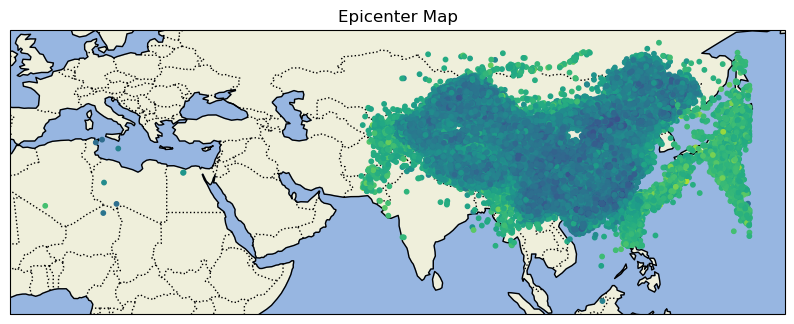

In [11]:
## 震中分布图
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
# 所有目录
# 注意：文件没有表头，需要手动指定列名
column_names = ['year', 'month', 'day', 'hour', 'minute', 'second', 'latitude', 'longitude', 'depth', 'mag_type', 'magnitude']
df = pd.read_csv('G:/BHT/CENCcat-format.txt', delim_whitespace=True, header=None, names=column_names)
# 合并日期和时间列，创建一个新的 'datetime' 列
df['time'] = pd.to_datetime(df[['year', 'month', 'day', 'hour', 'minute', 'second']])
# 绘制震中分布图
plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.scatter(df['longitude'], df['latitude'], c=df['magnitude'], cmap='viridis', s=10, transform=ccrs.PlateCarree())
#plt.colorbar(label='Magnitude')
plt.title('Epicenter Map')
plt.show()

### 图1（a） 灰色地形图加地震事件

In [ ]:
import pygmt
import pandas as pd


# 设置地图区域和投影
region = [100, 107, 23, 30]  # 经度范围: 99 到 106，纬度范围: 22 到 33
grid = pygmt.datasets.load_earth_relief(resolution='30s', region=region)
# 创建一个地图对象
fig = pygmt.Figure()



fig.grdimage(grid=grid, region=region, projection='M6i',cmap='light_gray.cpt',frame=True, shading=True, transparency=20)  
#fig.text(position="MC", text="PyGMT", font="80p,Helvetica-Bold,red@75")
# 添加颜色条（colorbar）
# fig.colorbar(
#     cmap="light_gray.cpt",     # 使用与图像相同的 CPT 文件
#     position="JMR+o0.5c/0c+w10c/0.5c",  # 设置颜色条位置和大小
#     frame=["xaf+lElevation (m)"],  # 添加标签，单位为米
# )


# 读取转换后的经纬度数据
data_file = "g:/鲁人齐最新全国断层数据/附表1-2与断层数据/processed_fault_data.txt"  # 你的数据文件路径
data = pd.read_csv(data_file, delim_whitespace=True, header=None, 
                   names=[ "FaultName", "Longitude", "Latitude"])
# 筛选出在该区域内的断层数据
data = data[
    (data["Longitude"] >= region[0]) & (data["Longitude"] <= region[1]) & 
    (data["Latitude"] >= region[2]) & (data["Latitude"] <= region[3])
]
fault_names = data['FaultName'].unique()



# 遍历每个 Faultname 分组并绘图

for fault in fault_names:
    # 筛选出当前 Faultname 的数据
    
    fault_data = data[data['FaultName'] == fault]
  
    fig.plot(x=fault_data["Longitude"], y=fault_data["Latitude"], pen="1p,#898989", label="Active fault")
    # 添加标题（显示 Faultname）
    # fig.text(
    #     x=midpoint_x,  # 调整位置到图形左上角
    #     y=midpoint_y,
    #     text=f"Fault: {fault}",
    #     font="12p,Helvetica-Bold,black",
    #     offset="0.2c"
    # )
# 结束循环
print("所有断层图已绘制完成。")


# 添加图例
#fig.legend(position="jTR+o0.2c/0.2c", box="+gwhite+p1p",transparency=0)
# 绘制第二个坐标文件的标记，样式为白色填充、黑色边框的圆点
# 读取第二个坐标文件（绘制白色填充黑色边框的圆点）
cities = pd.read_csv("G:/BHT/keycities.txt", sep=" ", header=None, names=["city","longitude", "latitude"], 
                    usecols=[0,1, 2], dtype={"longitude": float, "latitude": float})

fig.plot(x=cities["longitude"], y=cities["latitude"], style="c0.25c", fill="white", pen="0.5p,black",transparency=10)
# 读取城市坐标（绘制白色填充黑色边框的圆点）

# 6. 添加城市标签
for i, row in cities.iterrows():
    fig.text(x=row["longitude"], y=row["latitude"], text=row["city"], font="10p,black", justify="LT")

# 读取地震目录
# 读取文件数据，并命名列
columns = ["year", "month", "day", "hour", "minute", "second", "latitude", "longitude", "depth", "magnitude_type", "magnitude"]

# 读取文件

data_before_2000 = pd.read_csv("G:/BHT/catlog_before_2000.txt", delim_whitespace=True, header=None, names=columns)
data_from_2000 = pd.read_csv("G:/BHT/catlog_from_2000.txt", delim_whitespace=True, header=None, names=columns)
# 按震级大小画圆，以免被覆盖
data_before_2000 = data_before_2000.sort_values(by="magnitude", ascending=True)
data_from_2000 = data_from_2000.sort_values(by="magnitude", ascending=True)




# 震级5.0-5.9
data_before_2000_56 = data_before_2000[(data_before_2000["magnitude"] >= 5) & (data_before_2000["magnitude"] < 6)]
data_from_2000_56 = data_from_2000[(data_from_2000["magnitude"] >= 5) & (data_from_2000["magnitude"] < 6)]

# 绘制 5-5.9 数据 
fig.plot(
    x=data_before_2000_56["longitude"],
    y=data_before_2000_56["latitude"],
    style="c0.35c",  # 基本圆圈样式，后续会缩放
    #size=0.05 * (1.5**data_before_2000['magnitude']),  # 根据震级设置半径
    fill="#7b7c41",
   
    pen="0.5p,black"  # 黑色边界
)
fig.plot(
    x=data_from_2000_56["longitude"],
    y=data_from_2000_56["latitude"],
    style="c0.35c",  # 基本圆圈样式，后续会缩放
    #size=0.05 * (1.5**data_from_2000['magnitude']),  # 根据震级设置半径
    fill="#dbde57",
   
    pen="0.5p,black"  # 黑色边界
)

# 6.0-6.9
data_before_2000_67 = data_before_2000[(data_before_2000["magnitude"] >= 6) & (data_before_2000["magnitude"] < 7)]
data_from_2000_67 = data_from_2000[(data_from_2000["magnitude"] >= 6) & (data_from_2000["magnitude"] < 7)]
# 绘制 6-6.9 数据 
fig.plot(
    x=data_before_2000_67["longitude"],
    y=data_before_2000_67["latitude"],
    style="c0.55c",  # 基本圆圈样式，后续会缩放
    #size=0.05 * (1.5**data_before_2000['magnitude']),  # 根据震级设置半径
    fill="#7b7c41",
   
    pen="0.5p,black"  # 黑色边界
)
fig.plot(
    x=data_from_2000_67["longitude"],
    y=data_from_2000_67["latitude"],
    style="c0.55c",  # 基本圆圈样式，后续会缩放
    #size=0.05 * (1.5**data_from_2000['magnitude']),  # 根据震级设置半径
    fill="#dbde57",
   
    pen="0.5p,black"  # 黑色边界
)

#7-7.9
data_before_2000_78 = data_before_2000[(data_before_2000["magnitude"] >= 7) & (data_before_2000["magnitude"] < 8)]
data_from_2000_78 = data_from_2000[(data_from_2000["magnitude"] >= 7) & (data_from_2000["magnitude"] < 8)]
# 绘制 6-6.9 数据 
fig.plot(
    x=data_before_2000_78["longitude"],
    y=data_before_2000_78["latitude"],
    style="c0.8c",  # 基本圆圈样式，后续会缩放
    #size=0.05 * (1.5**data_before_2000['magnitude']),  # 根据震级设置半径
    fill="#7b7c41",
   
    pen="0.5p,black"  # 黑色边界
)
fig.plot(
    x=data_from_2000_78["longitude"],
    y=data_from_2000_78["latitude"],
    style="c0.8c",  # 基本圆圈样式，后续会缩放
    #size=0.05 * (1.5**data_from_2000['magnitude']),  # 根据震级设置半径
    fill="#dbde57",
   
    pen="0.5p,black"  # 黑色边界
)

#8-8.9
data_before_2000_89 = data_before_2000[data_before_2000["magnitude"] >= 8]
data_from_2000_89 = data_from_2000[data_from_2000["magnitude"] >= 8]

# 绘制 6-6.9 数据 
# fig.plot(
#     x=data_before_2000_89["longitude"],
#     y=data_before_2000_89["latitude"],
#     style="c0.4c",  # 基本圆圈样式，后续会缩放
#     #size=0.05 * (1.5**data_before_2000['magnitude']),  # 根据震级设置半径
#     fill="#7b7c41",
   
#     pen="0.5p,black"  # 黑色边界
# )
fig.plot(
    x=data_from_2000_89["longitude"],
    y=data_from_2000_89["latitude"],
    style="c1.1c",  # 基本圆圈样式，后续会缩放
    #size=0.05 * (1.5**data_from_2000['magnitude']),  # 根据震级设置半径
    fill="#dbde57",
   
    pen="0.5p,black"  # 黑色边界
)

# 显示图形
fig.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_22904\2482312000.py:25: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(data_file, delim_whitespace=True, header=None,


## 图1（b）画一个参考位置图，小图框出这一块，并画出所有地震目录

In [ ]:
data_all = pd.read_csv("G:/BHT/CENCcat-format.txt", delim_whitespace=True, header=None, names=columns)
# 震级小于5
data_small = data_all[data_all["magnitude"] <5]

fig.plot(
    x=data_small["longitude"],
    y=data_small["latitude"],
    style="c0.05c",  # 基本圆圈样式，后续会缩放
    #size=0.05 * (1.5**data_before_2000['magnitude']),  # 根据震级设置半径
    fill="black",
    transparency=20,
    pen="0.5p,black"  # 黑色边界
)

### 断层剖面地震密度图

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
d:\Anaconda\envs\eqtransformer\lib\site-packages\ipykernel_launcher.py:98: UserWarning: Glyph 22402 (\N{CJK UNIFIED IDEOGRAPH-5782}) missing from current font.
d:\Anaconda\envs\eqtransformer\lib\site-packages\ipykernel_launcher.py:98: UserWarning: Glyph 30452 (\N{CJK UNIFIED IDEOGRAPH-76F4}) missing from current font.
d:\Anaconda\envs\eqtransformer\lib\site-packages\ipykernel_launcher.py:98: UserWarning: Glyph 20110 (\N{CJK UNIFIED IDEOGRAPH-4E8E}) missing from current font.
d:\Anaconda\envs\eqtransformer\lib\site-packages\ipykernel_launcher.py:98: UserWarning: Glyph 26029 (\N{CJK UNIFIED IDEOGRAPH-65AD}) missing from current font.
d:\Anaconda\envs\eqtransformer\lib\site-packages\ipykernel_launcher.py:98: UserWarning: Glyph 23618 (\N{CJK UNIFIED IDEOGRAPH-5C42}) missing from current font.
d:\Anaconda\envs\eqtransformer\lib\site-packages\ipykernel_launcher.py:98: UserWarning: Gly

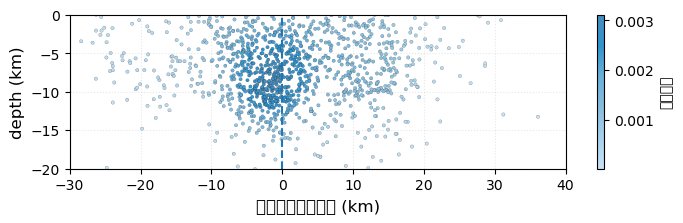

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import gaussian_kde, linregress
from matplotlib.colors import LinearSegmentedColormap
from math import atan2, degrees

def calculate_projection(eq_lons, eq_lats, fault_lons, fault_lats):
    """
    精确计算地震点到断层法线的投影距离
    返回: 投影距离数组(km)
    """
    # 1. 计算断层切线方向（差分相邻点）
    dx = np.diff(fault_lons) * 111.32 * np.cos(np.radians(np.mean(fault_lats)))
    dy = np.diff(fault_lats) * 111.32
    tangent_vectors = np.column_stack((dx, dy))
    
    # 2. 计算平均法向量（旋转切线90度）
    normal_vector = np.mean(np.column_stack((-tangent_vectors[:,1], tangent_vectors[:,0])), axis=0)
    normal_vector /= np.linalg.norm(normal_vector)  # 单位化
    
    # 3. 计算断层中心点（投影基准点）
    fault_center = np.array([
        np.mean(fault_lons) * 111.32 * np.cos(np.radians(np.mean(fault_lats))),
        np.mean(fault_lats) * 111.32
    ])
    
    # 4. 将地震点转换到公里坐标系
    eq_coords = np.column_stack((
        eq_lons * 111.32 * np.cos(np.radians(np.mean(fault_lats))),
        eq_lats * 111.32
    ))
    
    # 5. 计算投影距离
    projections = np.dot(eq_coords - fault_center, normal_vector)
    
    return projections

# 1. 加载数据
# 读取数据（根据您的格式）
column_names = ['id', 'lat', 'lon', 'depth', 'dx', 'dy', 'dz', 'EX', 'EY', 'EZ', 
                'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude',
                'NCCP', 'NCCS', 'NCTP', 'NCTS', 'RCC', 'RCT', 'CID']
eq_catalog = pd.read_csv('D:/MyRepository/Qiaojia/gamma2Hypoinverse/hypoDD_v2_1307_withmag_modified.reloc', 
                         delim_whitespace=True, header=0, names=column_names)


## 先试试沿水库走向
shuiku_lunkuo="G:/BHT/BHT_resevoir_lunkuo.txt" 
fault_data = pd.read_csv(shuiku_lunkuo, delim_whitespace=True, header=None, 
                   names=["lon", "lat"])
# fault_trace = pd.read_csv('fault_trace.csv')

# 计算投影距离
projection_dist = calculate_projection(
    eq_catalog['lon'].values,
    eq_catalog['lat'].values,
    fault_data['lon'].values,
    fault_data['lat'].values
)

# 准备绘图数据
x = projection_dist
y = -eq_catalog['depth'].values  # 深度向下为正

# 4. 选择断层附近的地震(距断层迹线一定范围内)
buffer_km = 30  # 选择断层两侧各20km范围内的地震
selected_eqs = eq_catalog.copy()

# 创建密度图
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]

colors = ['#C7E2F3', '#A6D1EA', '#87BDDD', '#6AB0DA', '#3193CD','#468EBF']
cmap = LinearSegmentedColormap.from_list('blue_gradient', colors)
# 绘制结果
plt.figure(figsize=(8, 2))
sc = plt.scatter(x, y, c=z, s=6, cmap=cmap,edgecolors='black',linewidths=0.1)
plt.colorbar(sc, label='地震密度')

# 标注断层位置
plt.axvline(0,  linestyle='--', label='断层线')


# 10. 图形美化
plt.xlabel('垂直于断层的距离 (km)', fontsize=12)
plt.ylabel('depth (km)', fontsize=12)
plt.ylim(-20,0)
plt.xlim(-30,40)
# plt.title(f'地震密度垂直剖面图\n计算断层走向: {strike:.1f}°', fontsize=14)
# plt.gca().invert_yaxis()
plt.grid(True,  linestyle=':', alpha=0.3)
# plt.legend()

# 11. 保存图形
plt.savefig('Fig4b_fault_perpendicular_density_profile.eps', dpi=650 )
plt.show()

### 沿水库线走向的深度分布图

/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_8265/418513207.py:69: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  fault_data = pd.read_csv('/Users/chouyuhin/_Workhome/Proj_Seismicgap/plotting/BHT_resevoir_lunkuo.txt',
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_8265/418513207.py:56: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  proj[i] = np.linalg.norm(eq - proj_point) * np.sign(np.cross(seg, eq - start))
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_8265/418513207.py:131: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/y4/__h0s0zj0qb4gjkjzynnyrcr0000gn/T/ipykernel_8265/418513207.py:132: UserWarning: Glyph 22320 (\N{CJK UNIFIED IDEOGRAPH-5730}) missing from f

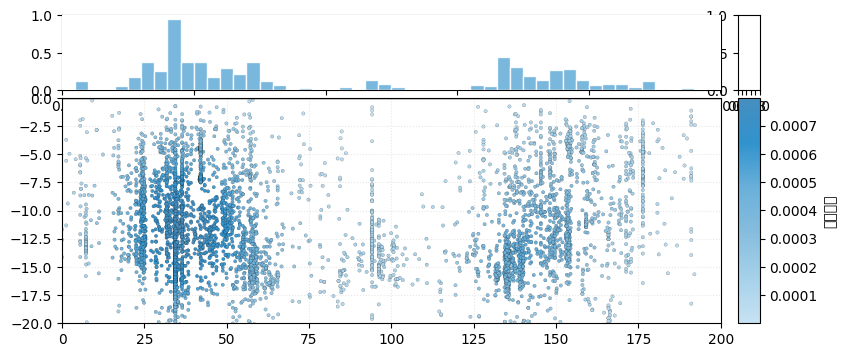

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import KDTree
from scipy.stats import gaussian_kde
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec

def calculate_along_fault_distance(eq_points, fault_points):
    mean_lat = np.mean(fault_points[:,1])
    lon_scale = 111.32 * np.cos(np.radians(mean_lat))
    lat_scale = 111.32

    fault_xy = np.column_stack((fault_points[:,0]*lon_scale, fault_points[:,1]*lat_scale))
    eq_xy = np.column_stack((eq_points[:,0]*lon_scale, eq_points[:,1]*lat_scale))

    segments = np.diff(fault_xy, axis=0)
    seg_len = np.linalg.norm(segments, axis=1)
    cum_len = np.insert(np.cumsum(seg_len), 0, 0)
    total_len = cum_len[-1]

    tree = KDTree(fault_xy)
    dists, idxs = tree.query(eq_xy)

    along = np.zeros_like(dists)
    proj = np.zeros_like(dists)

    for i, (idx, eq) in enumerate(zip(idxs, eq_xy)):
        if idx == 0:
            seg = segments[0]; start = fault_xy[0]; L = seg_len[0]
            t = np.dot(eq - start, seg) / (L**2)
            t = np.clip(t, 0, 1)
        elif idx == len(fault_xy)-1:
            seg = segments[-1]; start = fault_xy[-2]; L = seg_len[-1]
            t = np.dot(eq - start, seg) / (L**2)
            t = np.clip(t, 0, 1)
        else:
            v1 = fault_xy[idx] - fault_xy[idx-1]
            v2 = fault_xy[idx+1] - fault_xy[idx]
            d1 = np.dot(eq - fault_xy[idx-1], v1) / np.sum(v1**2)
            d2 = np.dot(eq - fault_xy[idx], v2) / np.sum(v2**2)
            if 0 <= d1 <= 1:
                seg, start, L, t = v1, fault_xy[idx-1], seg_len[idx-1], d1
            elif 0 <= d2 <= 1:
                seg, start, L, t = v2, fault_xy[idx], seg_len[idx], d2
            else:
                t = 0
                if idx == 0:
                    seg, start, L = v2, fault_xy[idx], seg_len[idx]
                elif idx == len(fault_xy)-1:
                    seg, start, L = v1, fault_xy[idx-1], seg_len[idx-1]
                else:
                    seg, start, L = v1, fault_xy[idx-1], seg_len[idx-1]
        proj_point = start + t * seg
        along[i] = cum_len[idx] + t * L
        proj[i] = np.linalg.norm(eq - proj_point) * np.sign(np.cross(seg, eq - start))
    return along, proj, total_len

# ---------------- 数据 ---------------- #
# column_names = ['id','lat','lon','depth','dx','dy','dz','EX','EY','EZ',
#                 'year','month','day','hour','minute','second','magnitude',
#                 'NCCP','NCCS','NCTP','NCTS','RCC','RCT','CID']
# eq_data = pd.read_csv('D:/MyRepository/Qiaojia/hypoDD_v2_1307_withmag_modified_final.reloc',
#                       delim_whitespace=True, header=0, names=column_names)
column_names_hypo = ['lat', 'lon', 'depth', 'year', 'month', 'day', 'hour', 'minute', 'second', 'magnitude','time']
eq_data = pd.read_csv(r'/Users/chouyuhin/_Workhome/Proj_Seismicgap/QJvalidation/hypoDD_final_allevents.reloc',  sep='\t', names=column_names_hypo,header=0)

eq_data['time'] = pd.to_datetime(eq_data[['year', 'month', 'day', 'hour', 'minute', 'second']])
fault_data = pd.read_csv('/Users/chouyuhin/_Workhome/Proj_Seismicgap/plotting/BHT_resevoir_lunkuo.txt',
                         delim_whitespace=True, header=None, names=["lon", "lat"])
fault_points = fault_data[['lon', 'lat']].values
eq_points = eq_data[['lon', 'lat']].values
along_dist, proj_dist, fault_length = calculate_along_fault_distance(eq_points, fault_points)

x = along_dist
y = -eq_data['depth'].values
magnitude = eq_data['magnitude'].values

# ---------------- 绘图 ---------------- #
xy = np.vstack([x, y])
z = gaussian_kde(xy)(xy)

colors = ['#C7E2F3', '#A6D1EA', '#87BDDD', '#6AB0DA', '#3193CD', '#468EBF']
cmap = LinearSegmentedColormap.from_list('blue_gradient', colors)





# ✅ 使用 GridSpec 分两列：主图和颜色条共一列，上方直方图独立共享宽度
fig = plt.figure(figsize=(9, 4))
gs = GridSpec(2, 2, width_ratios=[30, 1], height_ratios=[1, 3],
              hspace=0.05, wspace=0.05)
ax_hist = fig.add_subplot(gs[0])
ax_main = fig.add_subplot(gs[1], sharex=ax_hist)

xmin, xmax = 0, 200
# 上方直方图（左列）
ax_hist = fig.add_subplot(gs[0, 0])
# 主散点图（左列）
ax_main = fig.add_subplot(gs[1, 0], sharex=ax_hist)
# 颜色条（右列）
ax_cbar = fig.add_subplot(gs[1, 1])

# 绘制直方图（完全对齐）
bins = np.linspace(xmin, xmax, 51)
ax_hist.hist(x, bins=bins, color='#6AB0DA', edgecolor='white', alpha=0.9, align='mid')
ax_hist.set_xlim(xmin, xmax)
# 去掉所有刻度和标签
ax_hist.tick_params(axis='both', which='both', 
                    bottom=False, top=False, left=False, right=False, 
                    labelbottom=False, labelleft=False)
# ax_hist.set_ylabel('事件数', fontsize=10)
# ax_hist.tick_params(axis='x', labelbottom=False)
# ax_hist.grid(True, linestyle=':', alpha=0.3)
ax_hist.spines['top'].set_visible(False)
ax_hist.spines['right'].set_visible(False)
ax_hist.spines['left'].set_visible(False)
ax_hist.spines['bottom'].set_visible(False)

# 主图
sc = ax_main.scatter(x, y, c=z, s=6, cmap=cmap, edgecolors='black', linewidths=0.1)
plt.colorbar(sc, cax=ax_cbar, label='地震密度')
ax_main.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=1)
ax_main.set_xlim(xmin, xmax)
ax_main.set_ylim(-20, 0)
# ax_main.set_xlabel('沿断层走向的累计距离 (km)', fontsize=12)
# ax_main.set_ylabel('深度 (km)', fontsize=12)
ax_main.grid(True, linestyle=':', alpha=0.3)

plt.tight_layout()
plt.savefig('Fig5c_aligned_final.eps', dpi=650)
plt.show()